In [2]:
# Modules
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
Backpack_df = pd.read_csv('Data/train.csv')
Backpack_df

,id,Brand,Material,Size,Compartments,Laptop Compartment,Waterproof,Style,Color,Weight Capacity (kg),Price
0,0,Jansport,Leather,Medium,7.0,Yes,No,Tote,Black,11.611723,112.15875
1,1,Jansport,Canvas,Small,10.0,Yes,Yes,Messenger,Green,27.078537,68.88056
2,2,Under Armour,Leather,Small,2.0,Yes,No,Messenger,Red,16.643760,39.17320
3,3,Nike,Nylon,Small,8.0,Yes,No,Messenger,Green,12.937220,80.60793
4,4,Adidas,Canvas,Medium,1.0,Yes,Yes,Messenger,Green,17.749338,86.02312
...,...,...,...,...,...,...,...,...,...,...,...
299995,299995,Adidas,Leather,Small,9.0,No,No,Tote,Blue,12.730812,129.99749
299996,299996,Jansport,Leather,Large,6.0,No,Yes,Tote,Blue,26.633182,19.85819
299997,299997,Puma,Canvas,Large,9.0,Yes,Yes,Backpack,Pink,11.898250,111.41364
299998,299998,Adidas,Nylon,Small,1.0,No,Yes,Tote,Pink,6.175738,115.89080


In [4]:
Backpack_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    300000 non-null  int64  
 1   Brand                 290295 non-null  object 
 2   Material              291653 non-null  object 
 3   Size                  293405 non-null  object 
 4   Compartments          300000 non-null  float64
 5   Laptop Compartment    292556 non-null  object 
 6   Waterproof            292950 non-null  object 
 7   Style                 292030 non-null  object 
 8   Color                 290050 non-null  object 
 9   Weight Capacity (kg)  299862 non-null  float64
 10  Price                 300000 non-null  float64
dtypes: float64(3), int64(1), object(7)
memory usage: 25.2+ MB


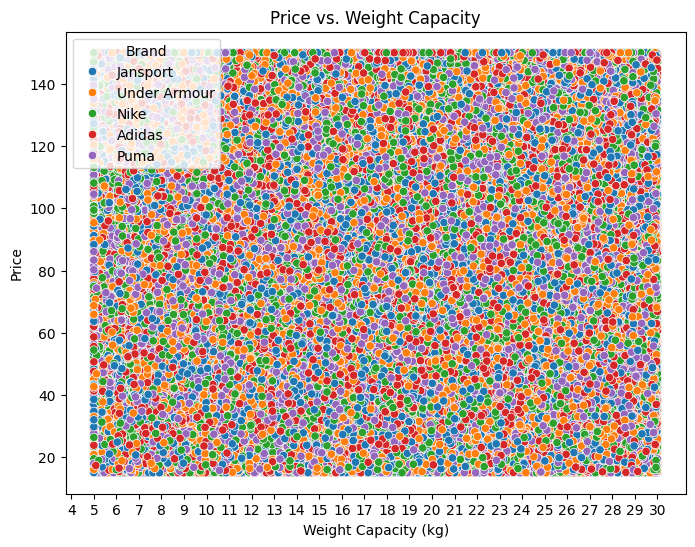

In [5]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Weight Capacity (kg)', y='Price', data=Backpack_df, hue='Brand')
plt.title('Price vs. Weight Capacity')
plt.xlabel('Weight Capacity (kg)')
plt.ylabel('Price')
plt.xticks(range(4, 31))
plt.savefig('Fig/All_Price_Weight.png')
plt.show()

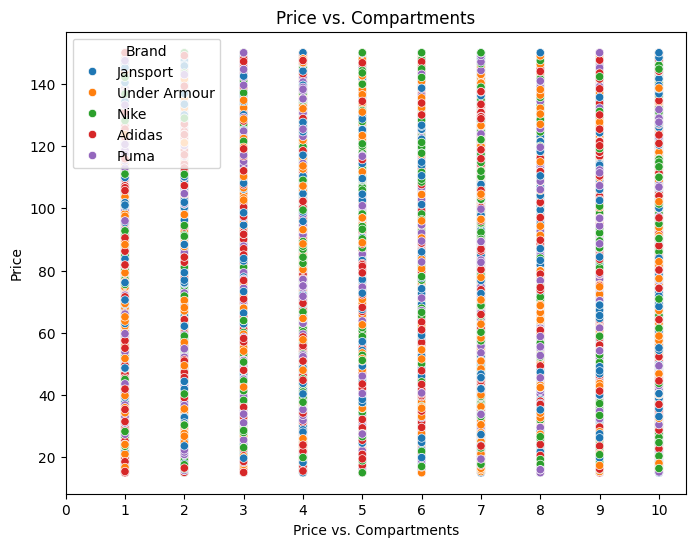

In [6]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Compartments', y='Price', data=Backpack_df, hue='Brand')
plt.title('Price vs. Compartments')
plt.xlabel('Price vs. Compartments')
plt.ylabel('Price')
plt.xticks(range(0, 11))
plt.savefig('Fig/All_Price_Compartments.png')
plt.show()

### Those backpacks don't have any relationship.
 Trying to make any multilinear regression without any relationships is only applying code. 

### Important columns in categorical values
- Brand
- Material
- Size
- Style
- Color

I will look for any relationship.

## Fill the NaN data
- New categorical
- NaN = 0.5 in data YES/NO 1/0
- Average value in 'Weight Capacity (kg)'

In [7]:
Backpack_df.columns

Index(['id', 'Brand', 'Material', 'Size', 'Compartments', 'Laptop Compartment',
       'Waterproof', 'Style', 'Color', 'Weight Capacity (kg)', 'Price'],
      dtype='object')

In [8]:
# new Brand NaN = small_brand
Backpack_df['Brand'] = Backpack_df['Brand'].fillna('small_brand')

In [9]:
# new Material NaN = mix_mat
Backpack_df['Material'] = Backpack_df['Material'].fillna('mix_mat')

In [10]:
# new Size NaN = non_Standar
Backpack_df['Size'] = Backpack_df['Size'].fillna('non_Standar')

In [11]:
# 'Laptop Compartment'  yes = 1 No = 0 Nan = 0.5 'Laptop Compartment'
# Backpack_df['Laptop Compartment'] = Backpack_df['Laptop Compartment'].replace(
#    to_replace={'Yes': 1, 'No': 0, 'NoData': 0.5})
Backpack_df['Laptop Compartment'] = Backpack_df['Laptop Compartment'].fillna('NoData')

In [12]:
# 'Waterproof' yes = 1 No = 0 Nan = 0.5 
# Backpack_df['Waterproof'] = Backpack_df['Waterproof'].replace(
#    to_replace={'Yes': 1, 'No': 0, 'Unknown': 0.5 })
Backpack_df['Waterproof'] = Backpack_df['Waterproof'].fillna('Unknown')

In [13]:
# new 'Style' NaN = non_Bag
Backpack_df['Style'] = Backpack_df['Style'].fillna('non_Bag')

In [14]:
# new 'Color' NaN = complex
Backpack_df['Color'] = Backpack_df['Color'].fillna('complex')

In [15]:
# 'Weight Capacity (kg)' NaN = average ()
Backpack_df['Weight Capacity (kg)'] = Backpack_df['Weight Capacity (kg)'].fillna(
    Backpack_df['Weight Capacity (kg)'].mean())

In [16]:
Backpack_df

,id,Brand,Material,Size,Compartments,Laptop Compartment,Waterproof,Style,Color,Weight Capacity (kg),Price
0,0,Jansport,Leather,Medium,7.0,Yes,No,Tote,Black,11.611723,112.15875
1,1,Jansport,Canvas,Small,10.0,Yes,Yes,Messenger,Green,27.078537,68.88056
2,2,Under Armour,Leather,Small,2.0,Yes,No,Messenger,Red,16.643760,39.17320
3,3,Nike,Nylon,Small,8.0,Yes,No,Messenger,Green,12.937220,80.60793
4,4,Adidas,Canvas,Medium,1.0,Yes,Yes,Messenger,Green,17.749338,86.02312
...,...,...,...,...,...,...,...,...,...,...,...
299995,299995,Adidas,Leather,Small,9.0,No,No,Tote,Blue,12.730812,129.99749
299996,299996,Jansport,Leather,Large,6.0,No,Yes,Tote,Blue,26.633182,19.85819
299997,299997,Puma,Canvas,Large,9.0,Yes,Yes,Backpack,Pink,11.898250,111.41364
299998,299998,Adidas,Nylon,Small,1.0,No,Yes,Tote,Pink,6.175738,115.89080


In [17]:
Backpack_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    300000 non-null  int64  
 1   Brand                 300000 non-null  object 
 2   Material              300000 non-null  object 
 3   Size                  300000 non-null  object 
 4   Compartments          300000 non-null  float64
 5   Laptop Compartment    300000 non-null  object 
 6   Waterproof            300000 non-null  object 
 7   Style                 300000 non-null  object 
 8   Color                 300000 non-null  object 
 9   Weight Capacity (kg)  300000 non-null  float64
 10  Price                 300000 non-null  float64
dtypes: float64(3), int64(1), object(7)
memory usage: 25.2+ MB


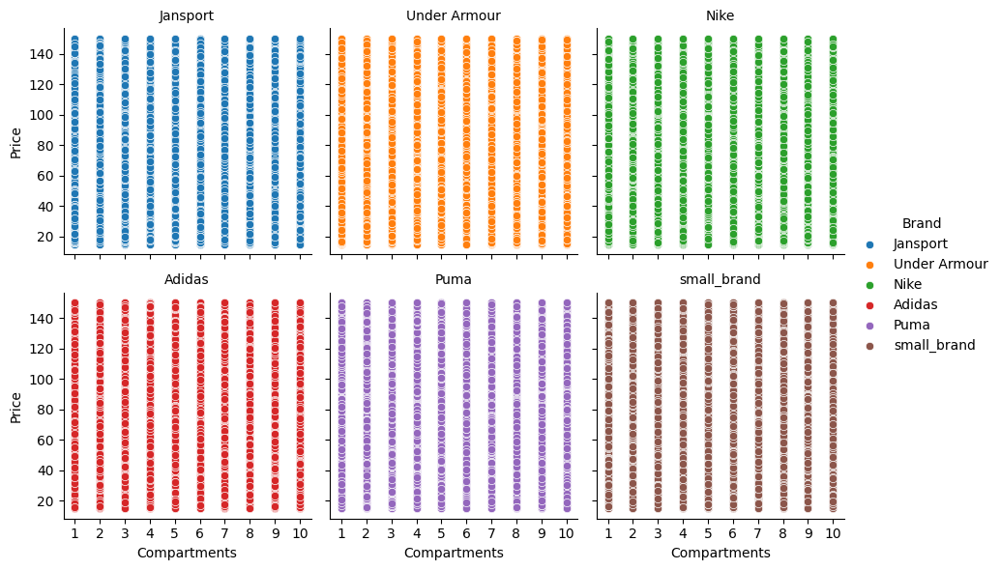

In [18]:
# FacetGrid for separate plots per Brand.
g = sns.FacetGrid(Backpack_df, col='Brand', hue='Brand', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Compartments', 'Price')
g.add_legend()
g.set_axis_labels('Compartments', 'Price')
g.set_titles(col_template="{col_name}")
g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Brand_Price_Compartment.png')
plt.show()

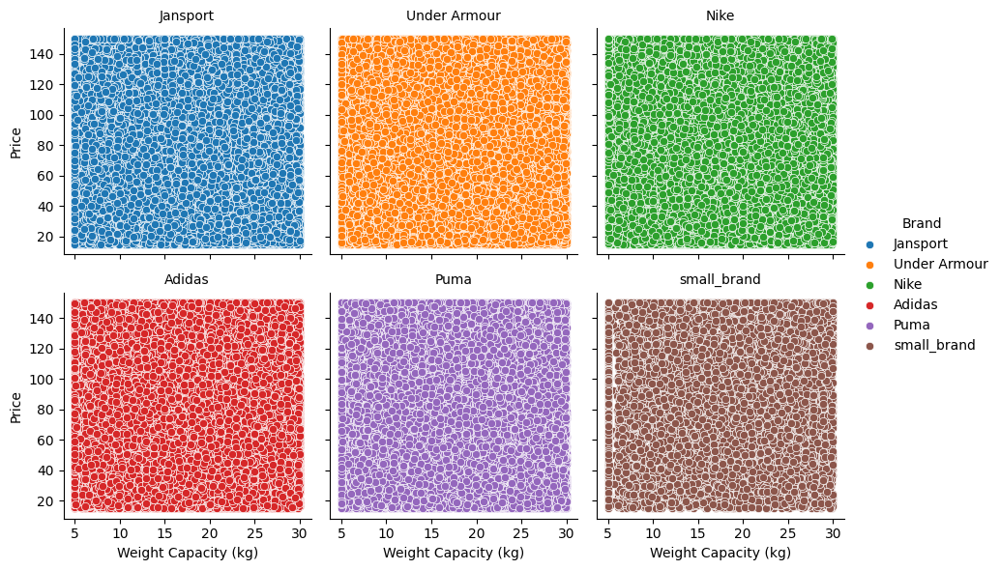

In [19]:
# FacetGrid for separate plots per Brand.
g = sns.FacetGrid(Backpack_df, col='Brand', hue='Brand', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight Capacity (kg)', 'Price')
g.add_legend()
g.set_axis_labels('Weight Capacity (kg)', 'Price')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Brand_Price_Weight.png')
plt.show()

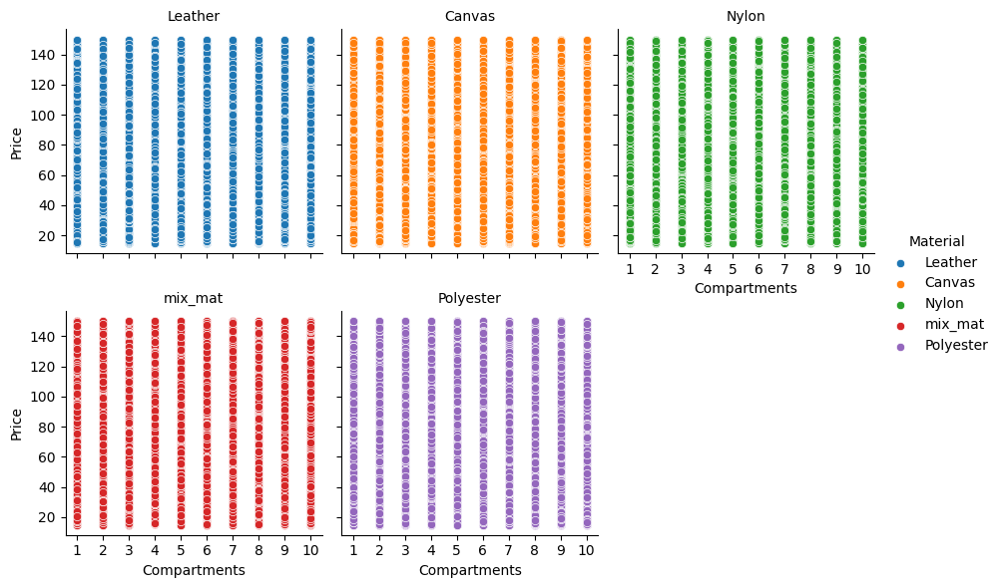

In [20]:
# FacetGrid for separate plots per Material.
g = sns.FacetGrid(Backpack_df, col='Material', hue='Material', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Compartments', 'Price')
g.add_legend()
g.set_axis_labels('Compartments', 'Price')
g.set_titles(col_template="{col_name}")
g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Material_Price_Compartment.png')
plt.show()

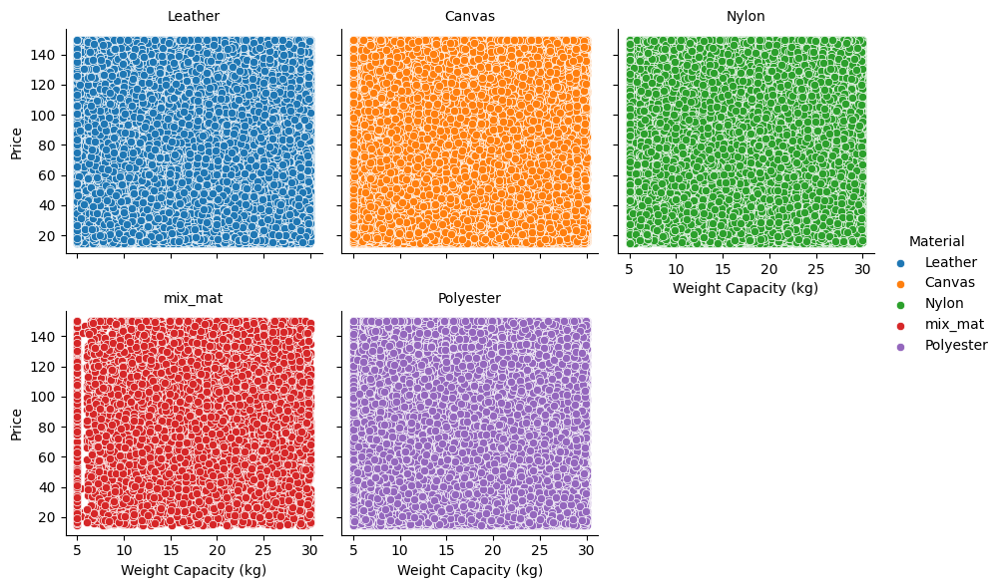

In [21]:
# FacetGrid for separate plots per Material.
g = sns.FacetGrid(Backpack_df, col='Material', hue='Material', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight Capacity (kg)', 'Price')
g.add_legend()
g.set_axis_labels('Weight Capacity (kg)', 'Price')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Material_Price_Weight.png')
plt.show()

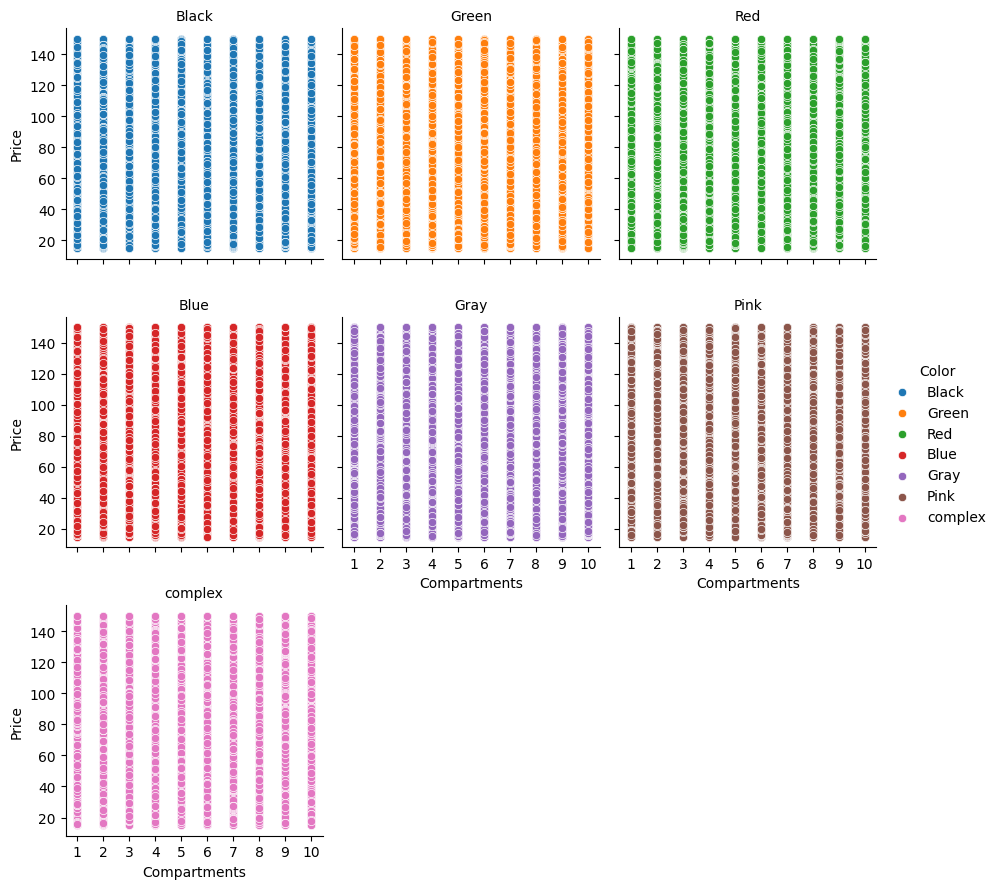

In [23]:
# FacetGrid for separate plots per Color.
g = sns.FacetGrid(Backpack_df, col='Color', hue='Color', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Compartments', 'Price')
g.add_legend()
g.set_axis_labels('Compartments', 'Price')
g.set_titles(col_template="{col_name}")
g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Color_Price_Compartment.png')
plt.show()

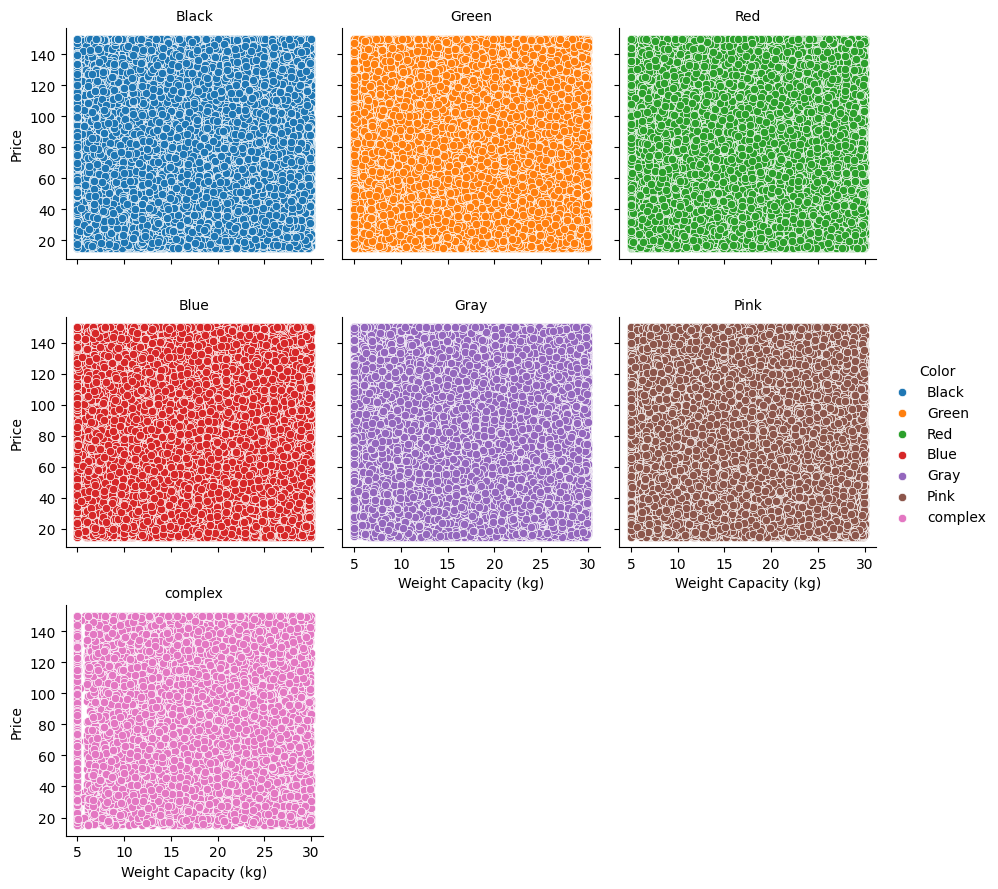

In [24]:
# FacetGrid for separate plots per Color.
g = sns.FacetGrid(Backpack_df, col='Color', hue='Color', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight Capacity (kg)', 'Price')
g.add_legend()
g.set_axis_labels('Weight Capacity (kg)', 'Price')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Color_Price_Weight.png')
plt.show()

### Isolate a Brand

In [25]:
Backpack_df['Brand'].unique()

array(['Jansport', 'Under Armour', 'Nike', 'Adidas', 'Puma',
       'small_brand'], dtype=object)

In [26]:
Backpack_df_Jansport = Backpack_df[Backpack_df['Brand']== 'Jansport']

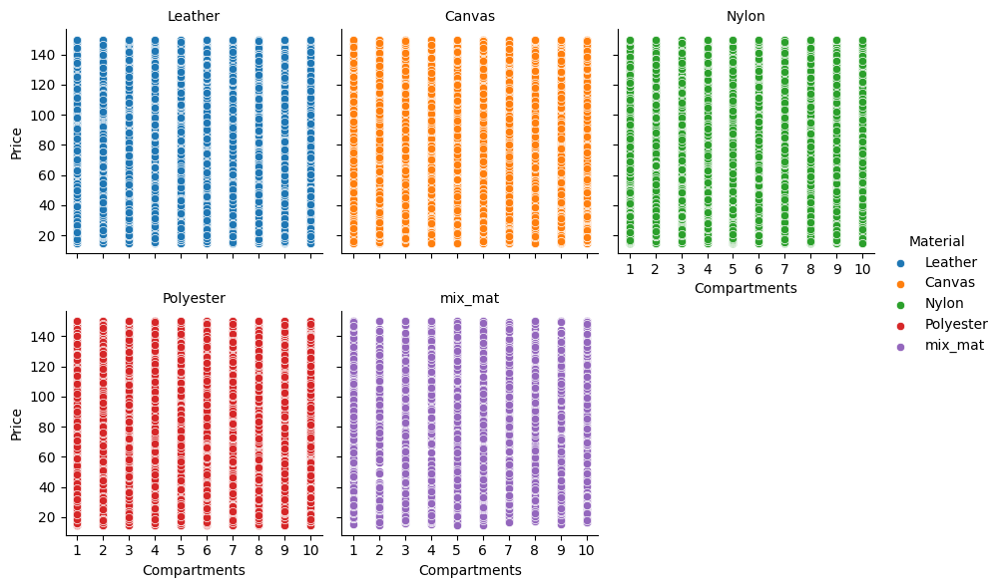

In [27]:
# FacetGrid for separate plots per Material.
g = sns.FacetGrid(Backpack_df_Jansport, col='Material', hue='Material', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Compartments', 'Price')
g.add_legend()
g.set_axis_labels('Compartments', 'Price')
g.set_titles(col_template="{col_name}")
g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Jansport_Material_Price_Compartment.png')
plt.show()

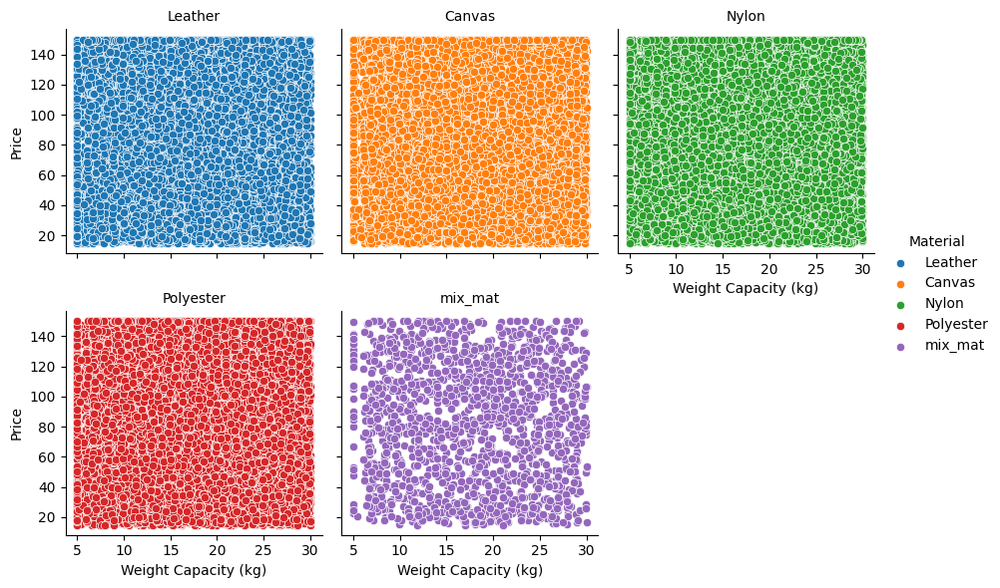

In [28]:
# FacetGrid for separate plots per Material.
g = sns.FacetGrid(Backpack_df_Jansport, col='Material', hue='Material', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight Capacity (kg)', 'Price')
g.add_legend()
g.set_axis_labels('Weight Capacity (kg)', 'Price')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Jansport_Material_Price_Weight.png')
plt.show()

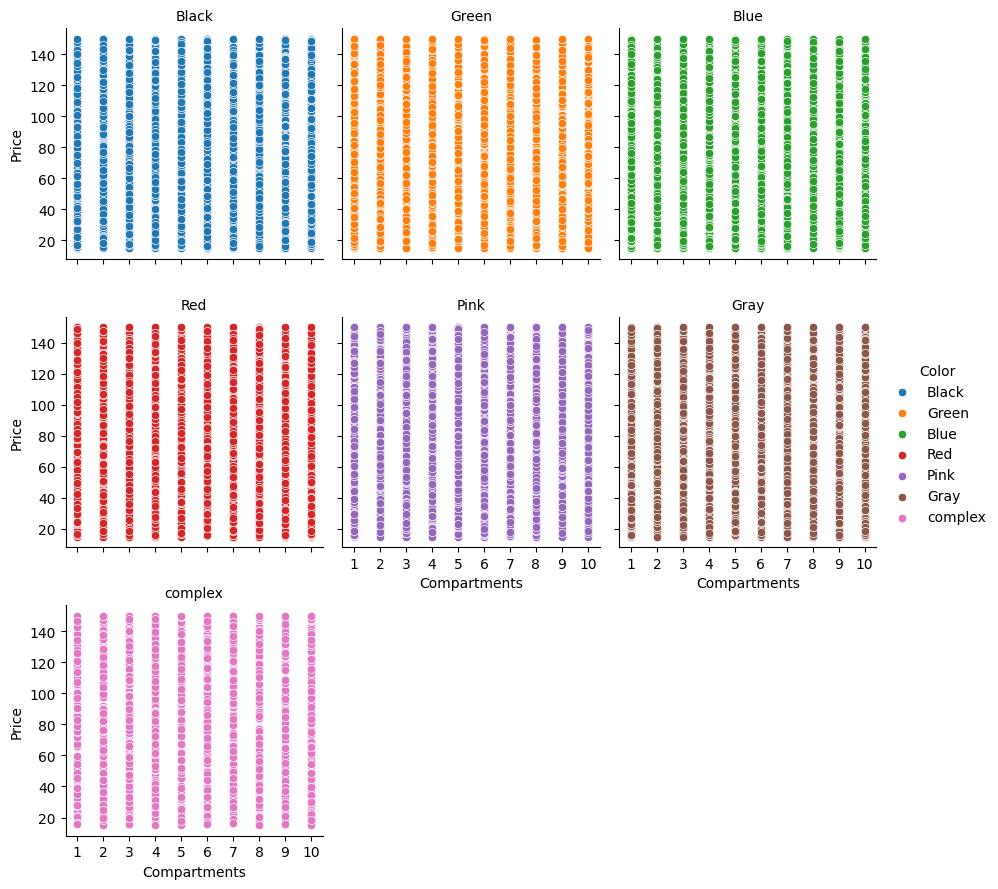

In [29]:
# FacetGrid for separate plots per Color.
g = sns.FacetGrid(Backpack_df_Jansport, col='Color', hue='Color', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Compartments', 'Price')
g.add_legend()
g.set_axis_labels('Compartments', 'Price')
g.set_titles(col_template="{col_name}")
g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Jansport_Color_Price_Compartment.png')
plt.show()

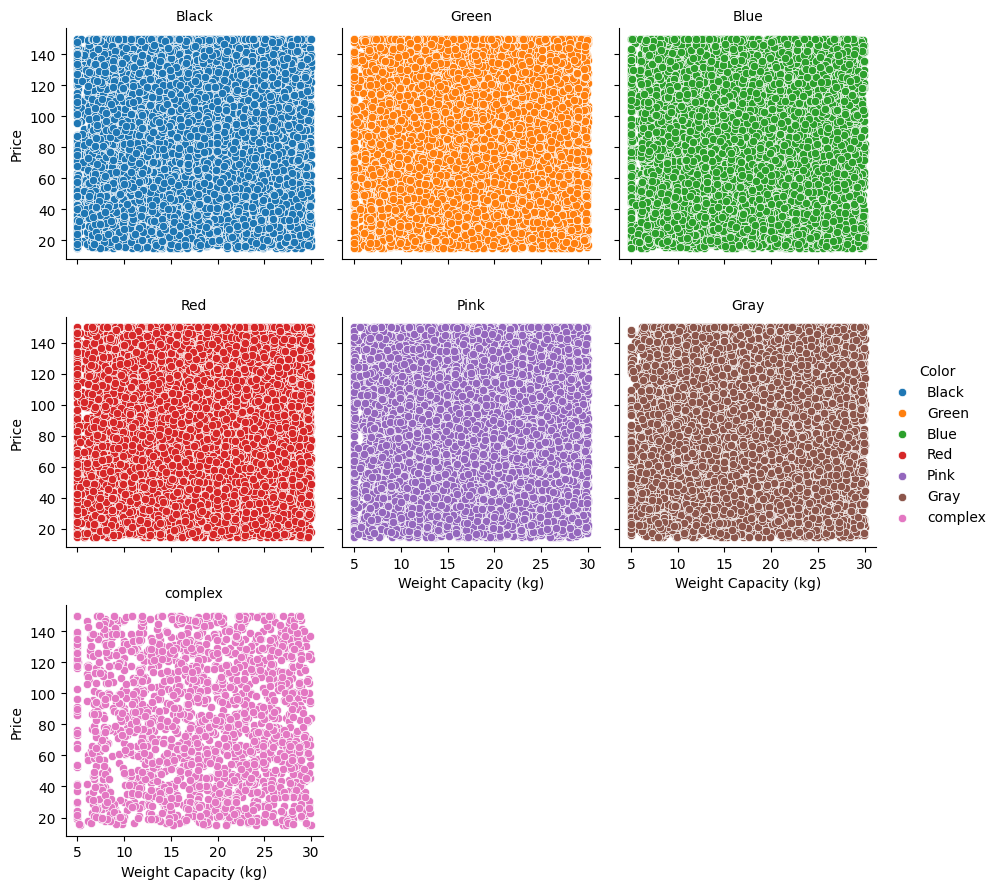

In [30]:
# FacetGrid for separate plots per Color.
g = sns.FacetGrid(Backpack_df_Jansport, col='Color', hue='Color', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight Capacity (kg)', 'Price')
g.add_legend()
g.set_axis_labels('Weight Capacity (kg)', 'Price')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Jansport_Color_Price_Weight.png')
plt.show()

In [31]:
Backpack_df_Adidas = Backpack_df[Backpack_df['Brand']== 'Adidas']

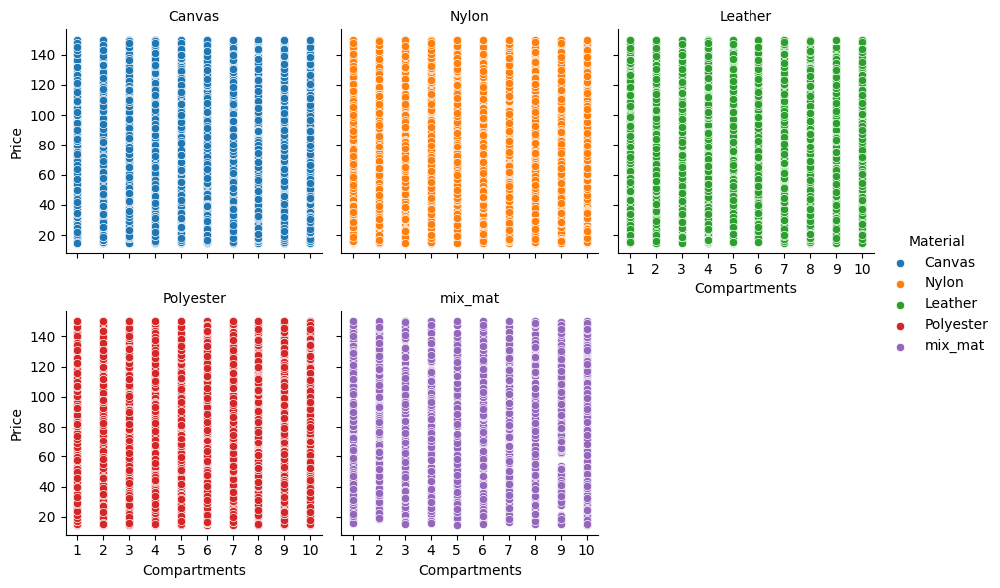

In [32]:
# FacetGrid for separate plots per Material.
g = sns.FacetGrid(Backpack_df_Adidas, col='Material', hue='Material', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Compartments', 'Price')
g.add_legend()
g.set_axis_labels('Compartments', 'Price')
g.set_titles(col_template="{col_name}")
g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Adidas_Material_Price_Compartment.png')
plt.show()

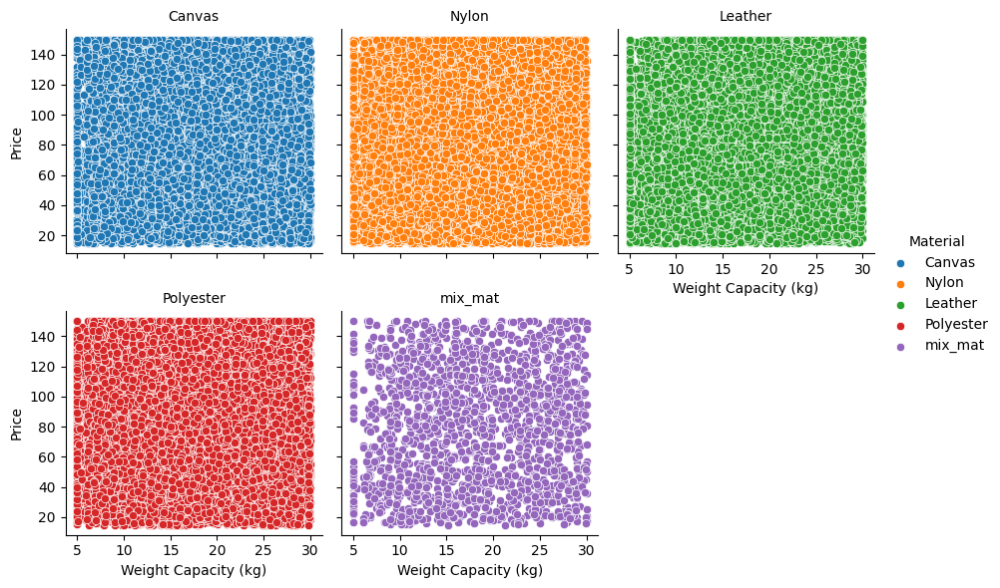

In [33]:
# FacetGrid for separate plots per Material.
g = sns.FacetGrid(Backpack_df_Adidas, col='Material', hue='Material', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight Capacity (kg)', 'Price')
g.add_legend()
g.set_axis_labels('Weight Capacity (kg)', 'Price')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Adidas_Material_Price_Weight.png')
plt.show()

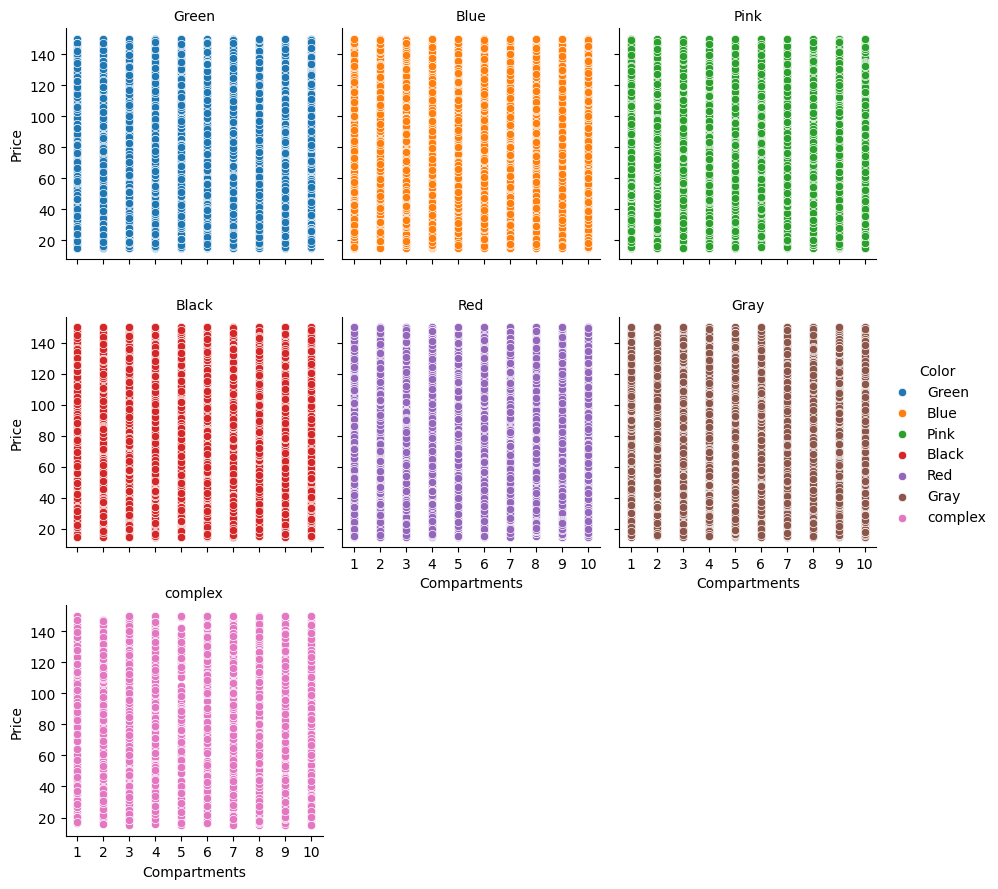

In [34]:
# FacetGrid for separate plots per Color.
g = sns.FacetGrid(Backpack_df_Adidas, col='Color', hue='Color', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Compartments', 'Price')
g.add_legend()
g.set_axis_labels('Compartments', 'Price')
g.set_titles(col_template="{col_name}")
g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Adidas_Color_Price_Compartment.png')
plt.show()

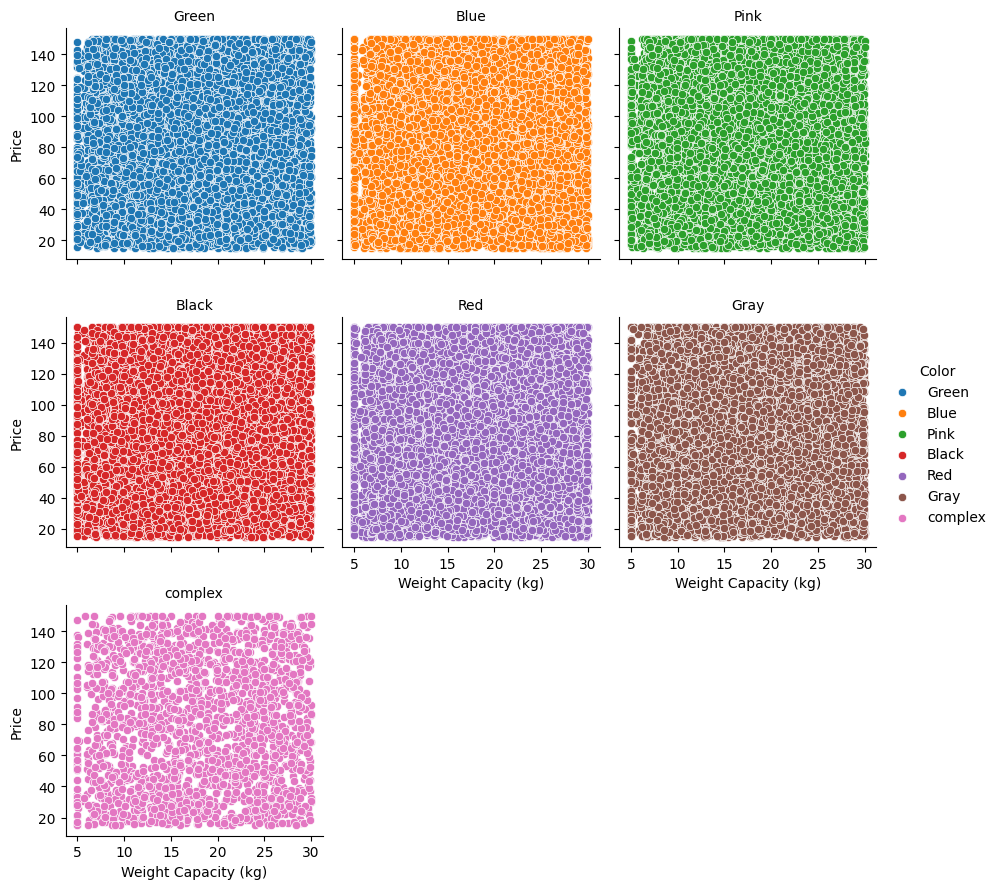

In [35]:
# FacetGrid for separate plots per Color.
g = sns.FacetGrid(Backpack_df_Adidas, col='Color', hue='Color', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight Capacity (kg)', 'Price')
g.add_legend()
g.set_axis_labels('Weight Capacity (kg)', 'Price')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/JAdidas_Color_Price_Weight.png')
plt.show()

### Isolate Material

In [36]:
Backpack_df['Material'].unique()

array(['Leather', 'Canvas', 'Nylon', 'mix_mat', 'Polyester'], dtype=object)

In [37]:
Backpack_df_Leather = Backpack_df[Backpack_df['Material']== 'Leather']

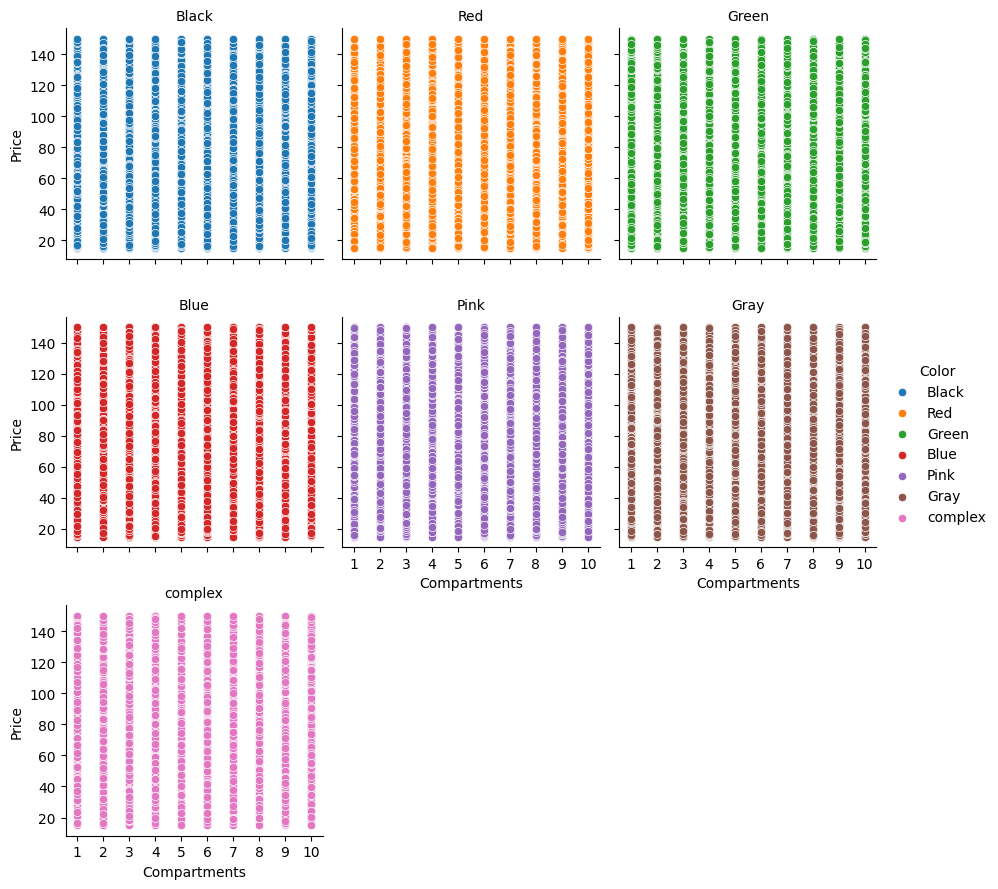

In [38]:
# FacetGrid for separate plots per Color.
g = sns.FacetGrid(Backpack_df_Leather, col='Color', hue='Color', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Compartments', 'Price')
g.add_legend()
g.set_axis_labels('Compartments', 'Price')
g.set_titles(col_template="{col_name}")
g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Leather_Color_Price_Compartment.png')
plt.show()

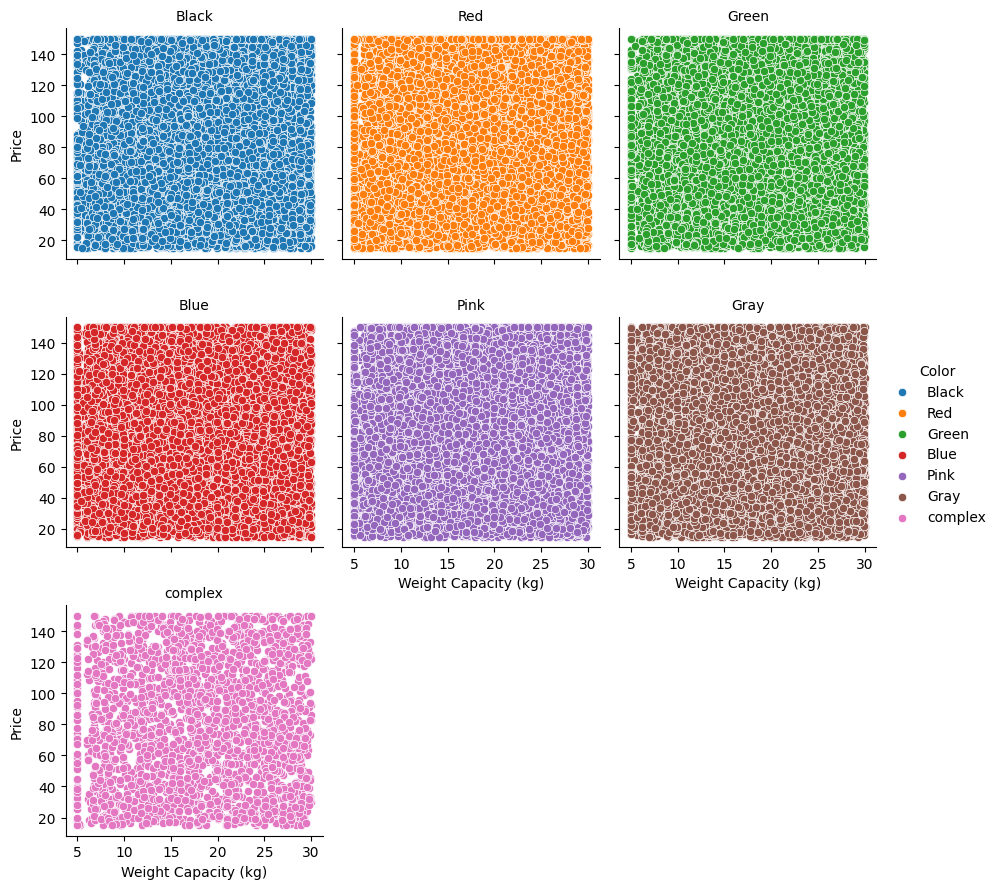

In [39]:
# FacetGrid for separate plots per Color.
g = sns.FacetGrid(Backpack_df_Leather, col='Color', hue='Color', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight Capacity (kg)', 'Price')
g.add_legend()
g.set_axis_labels('Weight Capacity (kg)', 'Price')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Leather_Color_Price_Weight.png')
plt.show()

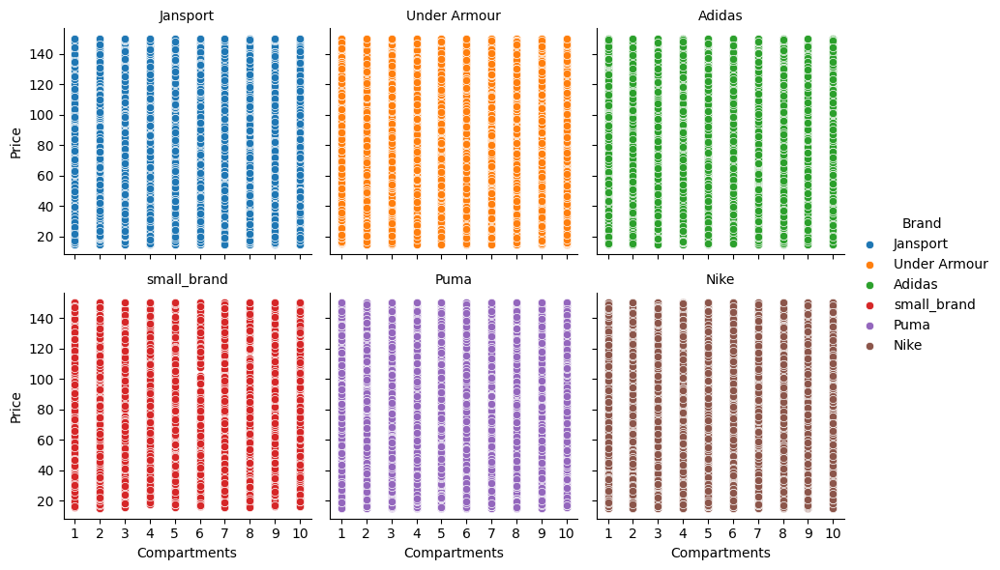

In [40]:
# FacetGrid for separate plots per Brand.
g = sns.FacetGrid(Backpack_df_Leather, col='Brand', hue='Brand', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Compartments', 'Price')
g.add_legend()
g.set_axis_labels('Compartments', 'Price')
g.set_titles(col_template="{col_name}")
g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Leather_Brand_Price_Compartment.png')
plt.show()

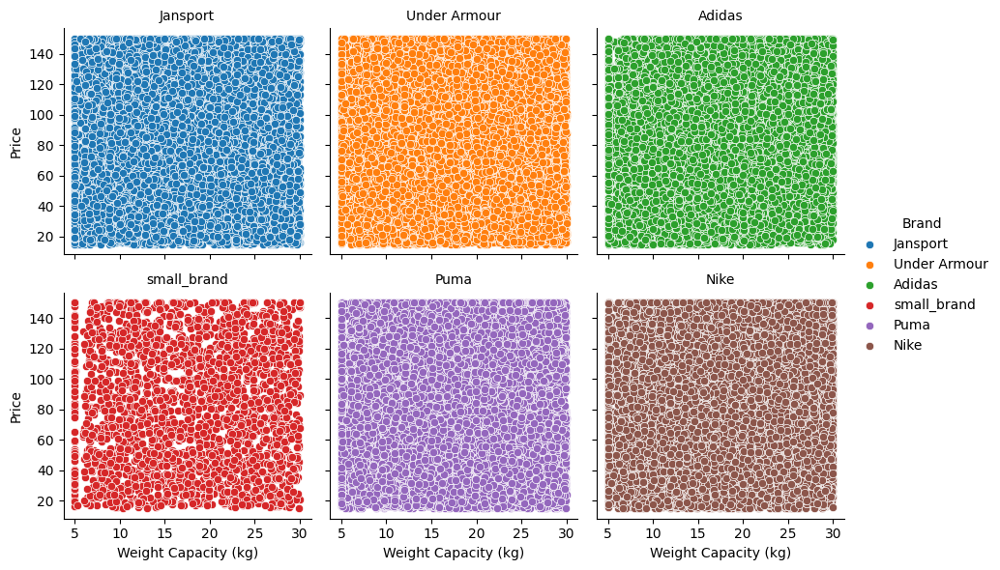

In [41]:
# FacetGrid for separate plots per Brand.
g = sns.FacetGrid(Backpack_df_Leather, col='Brand', hue='Brand', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight Capacity (kg)', 'Price')
g.add_legend()
g.set_axis_labels('Weight Capacity (kg)', 'Price')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Leather_Brand_Price_Weight.png')
plt.show()

### Isolate color

In [42]:
Backpack_df['Color'].unique()

array(['Black', 'Green', 'Red', 'Blue', 'Gray', 'Pink', 'complex'],
      dtype=object)

In [43]:
Backpack_df_Blue = Backpack_df[Backpack_df['Color']== 'Blue']

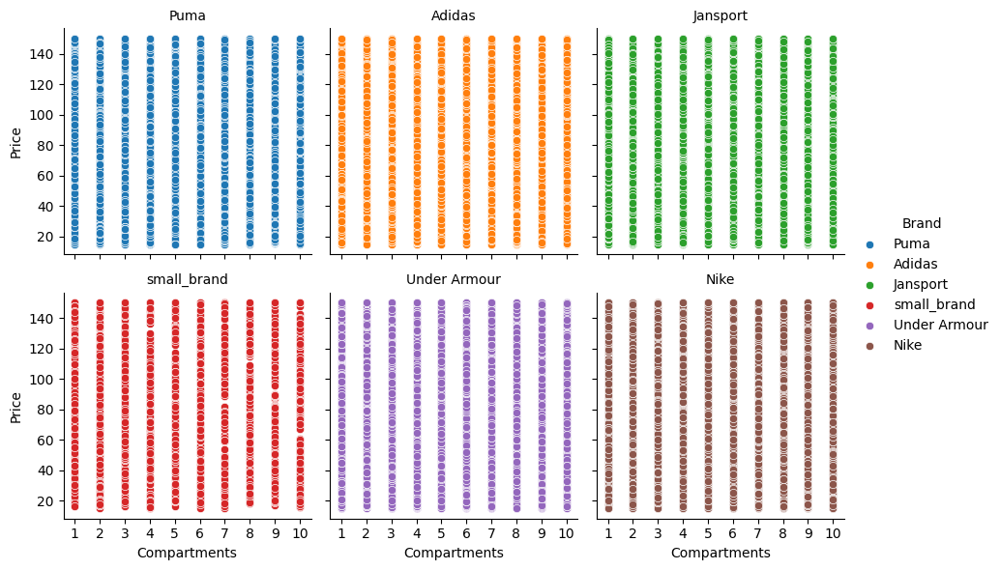

In [44]:
# FacetGrid for separate plots per Brand.
g = sns.FacetGrid(Backpack_df_Blue, col='Brand', hue='Brand', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Compartments', 'Price')
g.add_legend()
g.set_axis_labels('Compartments', 'Price')
g.set_titles(col_template="{col_name}")
g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Blue_Brand_Price_Compartment.png')
plt.show()

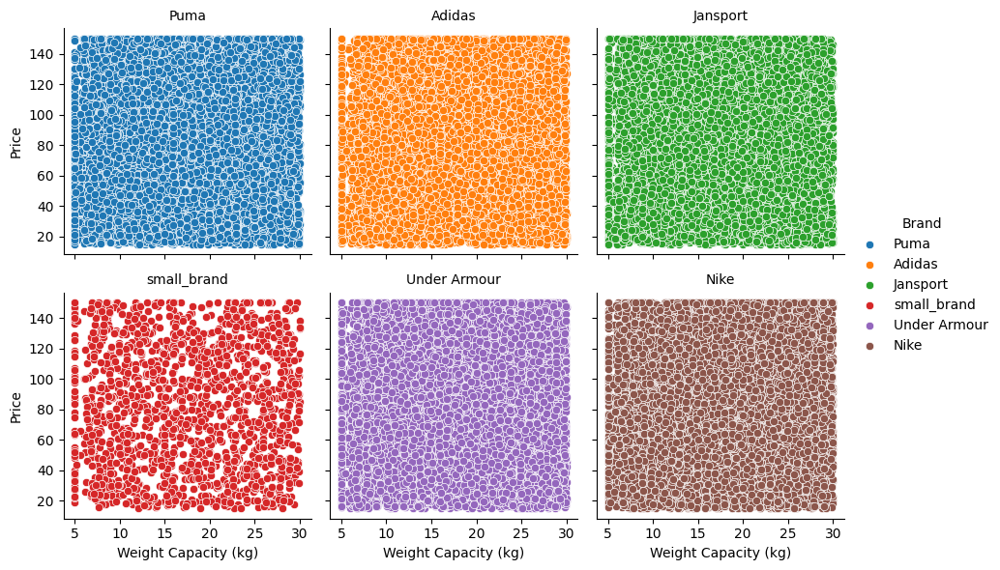

In [45]:
# FacetGrid for separate plots per Brand.
g = sns.FacetGrid(Backpack_df_Blue, col='Brand', hue='Brand', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight Capacity (kg)', 'Price')
g.add_legend()
g.set_axis_labels('Weight Capacity (kg)', 'Price')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Blue_Brand_Price_Weight.png')
plt.show()

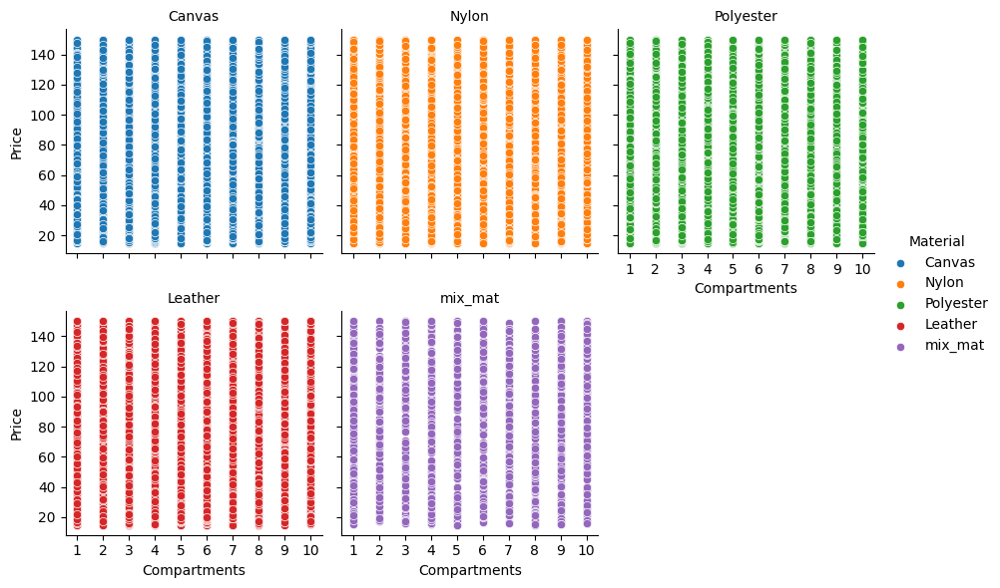

In [46]:
# FacetGrid for separate plots per Material.
g = sns.FacetGrid(Backpack_df_Blue, col='Material', hue='Material', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Compartments', 'Price')
g.add_legend()
g.set_axis_labels('Compartments', 'Price')
g.set_titles(col_template="{col_name}")
g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Blue_Material_Price_Compartment.png')
plt.show()

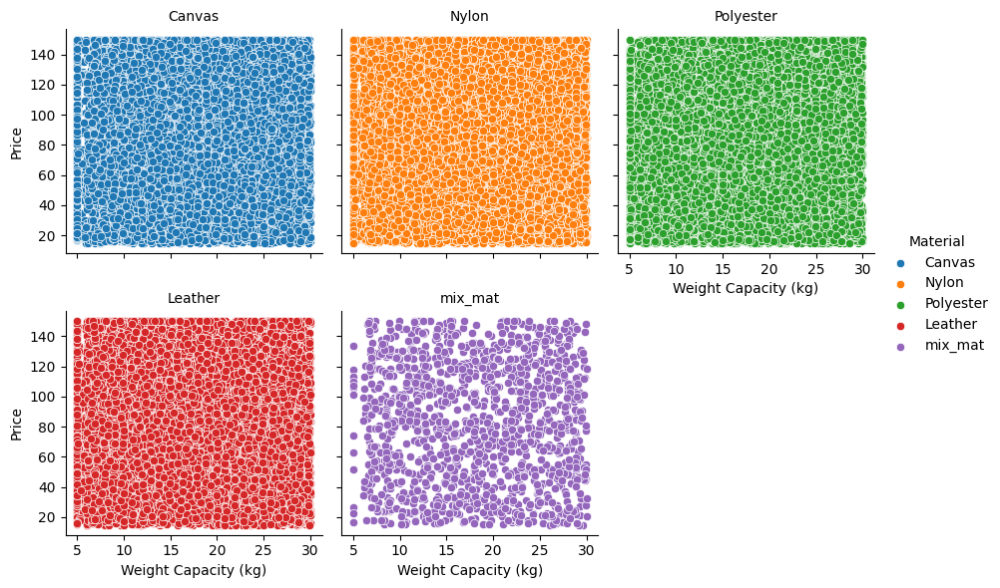

In [47]:
# FacetGrid for separate plots per Material.
g = sns.FacetGrid(Backpack_df_Blue, col='Material', hue='Material', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight Capacity (kg)', 'Price')
g.add_legend()
g.set_axis_labels('Weight Capacity (kg)', 'Price')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Blue_Material_Price_Weight.png')
plt.show()

### A continuum on 'Weight Capacity (kg)' makes it difficult to find relations
- divide the carrying capacity in a range of 1 kg
- divide the carrying capacity in a range of 5 kg
- divide the price into five units
- divide the price into fifteen units

In [48]:
# makes the weight capacity in the range of 1kg
Backpack_df['Weight range'] = np.floor(Backpack_df['Weight Capacity (kg)']).astype(int)

In [49]:
Weigth_range1 = Backpack_df['Weight range'].value_counts().sort_index()

In [50]:
# makes the weight capacity in the range of 5kg
Backpack_df['Weight range 5'] = (np.floor((Backpack_df['Weight Capacity (kg)'] - 5) / 5)).astype(int)

In [51]:
Weigth_range2 = Backpack_df['Weight range 5'].value_counts().sort_index()

In [52]:
# makes the price in range 5 units
Backpack_df['Price Bin 5'] = (np.floor((Backpack_df['Price'] - 15) / 5)).astype(int) 

In [53]:
Price_5 = Backpack_df['Price Bin 5'].value_counts().sort_index()

In [54]:
# makes the price in range 15 units
Backpack_df['Price Bin 15'] = (np.floor((Backpack_df['Price'] - 15) / 15)).astype(int) 

In [55]:
Price_5 = Backpack_df['Price Bin 15'].value_counts().sort_index()

In [56]:
Backpack_df

,id,Brand,Material,Size,Compartments,Laptop Compartment,Waterproof,Style,Color,Weight Capacity (kg),Price,Weight range,Weight range 5,Price Bin 5,Price Bin 15
0,0,Jansport,Leather,Medium,7.0,Yes,No,Tote,Black,11.611723,112.15875,11,1,19,6
1,1,Jansport,Canvas,Small,10.0,Yes,Yes,Messenger,Green,27.078537,68.88056,27,4,10,3
2,2,Under Armour,Leather,Small,2.0,Yes,No,Messenger,Red,16.643760,39.17320,16,2,4,1
3,3,Nike,Nylon,Small,8.0,Yes,No,Messenger,Green,12.937220,80.60793,12,1,13,4
4,4,Adidas,Canvas,Medium,1.0,Yes,Yes,Messenger,Green,17.749338,86.02312,17,2,14,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299995,299995,Adidas,Leather,Small,9.0,No,No,Tote,Blue,12.730812,129.99749,12,1,22,7
299996,299996,Jansport,Leather,Large,6.0,No,Yes,Tote,Blue,26.633182,19.85819,26,4,0,0
299997,299997,Puma,Canvas,Large,9.0,Yes,Yes,Backpack,Pink,11.898250,111.41364,11,1,19,6
299998,299998,Adidas,Nylon,Small,1.0,No,Yes,Tote,Pink,6.175738,115.89080,6,0,20,6


In [124]:
Backpack_df['Price 15'] =Backpack_df['Price Bin 15']*15 +15

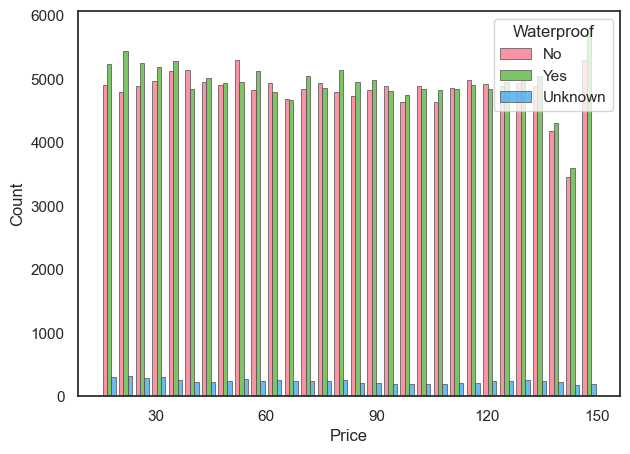

In [99]:
sns.set_theme(style="white")

f, ax = plt.subplots(figsize=(7, 5))
# sns.despine(f)

sns.histplot(
    Backpack_df,
    x="Price", hue="Waterproof",
    multiple= 'dodge', # 'fill', “stack”,
    shrink=.8,
    kde=False,
    bins=30,
    palette="husl",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
)

ax.set_xticks([30, 60, 90, 120, 150])
plt.savefig('Fig/price_waterproof.png')
plt.show()

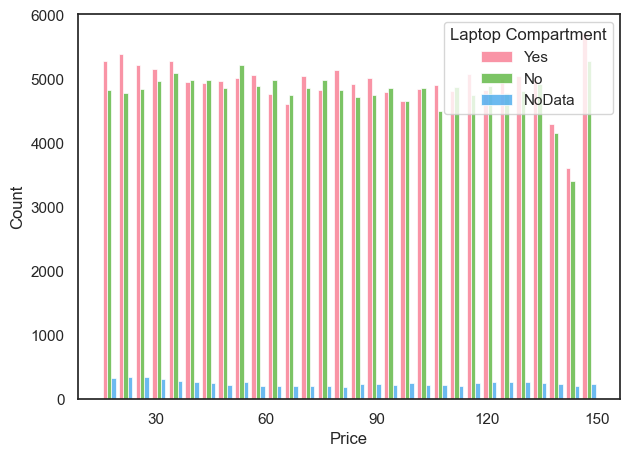

In [98]:
sns.set_theme(style="white")


f, ax = plt.subplots(figsize=(7, 5))
# sns.despine(f)

sns.histplot(
    Backpack_df,
    x="Price", hue="Laptop Compartment",
    multiple= 'dodge', # 'fill', “stack”,
    shrink=.8,
    kde=False,
    bins=30,
    palette="husl",
    # edgecolor=".3",
    linewidth=.5,
    log_scale=False,
)

ax.set_xticks([30, 60, 90, 120, 150])
plt.savefig('Fig/price_Laptop_C.png')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make Axe

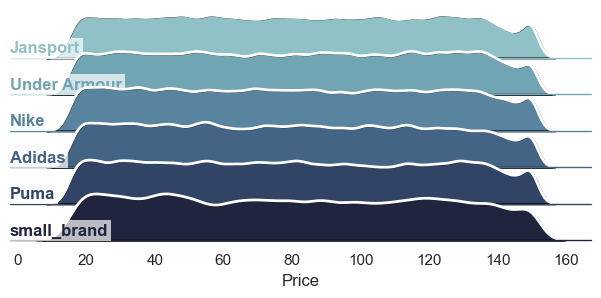

In [123]:
import matplotlib.patheffects as path_effects

sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

# Initialize the FacetGrid object
pal = sns.cubehelix_palette(6, rot=-.25, light=.7)
g = sns.FacetGrid(Backpack_df, row="Brand", hue="Brand", aspect=15, height=.5, palette=pal)

# Draw the densities in a few steps
g.map(sns.kdeplot, "Price",
      bw_adjust=.5, clip_on=False,
      fill=True, alpha=1, linewidth=1.5, edgecolor='black')
g.map(sns.kdeplot, "Price", clip_on=False, color="w", lw=2, bw_adjust=.5)

# Passing color=None to refline() uses the hue mapping
g.refline(y=0, linewidth=1, linestyle="-", color=None, clip_on=False)

# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes,
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, pad=2)) # Add background

    #Alternative add border
    #ax.text(0, .2, label, fontweight="bold", color=color,
    #        ha="left", va="center", transform=ax.transAxes,
    #        path_effects=[path_effects.withStroke(linewidth=3, foreground='white')]) # Add border

g.map(label, "Price")

# Set the subplots to overlap
g.figure.subplots_adjust(hspace=-.25)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(offset=100, trim=True, bottom=True, left=True)

plt.savefig('Fig/Price_Brand_Nostromo.png')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make Axe

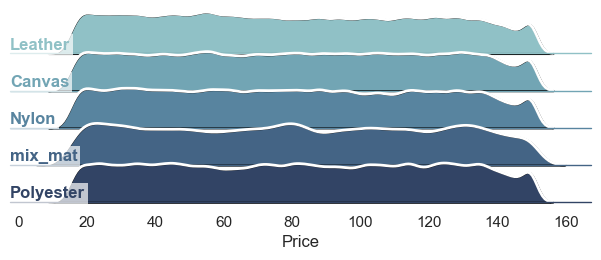

In [122]:

sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

# Initialize the FacetGrid object
pal = sns.cubehelix_palette(6, rot=-.25, light=.7)
g = sns.FacetGrid(Backpack_df, row="Material", hue="Material", aspect=15, height=.5, palette=pal)

# Draw the densities in a few steps
g.map(sns.kdeplot, "Price",
      bw_adjust=.5, clip_on=False,
      fill=True, alpha=1, linewidth=1.5, edgecolor='black')
g.map(sns.kdeplot, "Price", clip_on=False, color="w", lw=2, bw_adjust=.5)

# Passing color=None to refline() uses the hue mapping
g.refline(y=0, linewidth=1, linestyle="-", color=None, clip_on=False)

# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes,
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, pad=2)) # Add background

    #Alternative add border
    #ax.text(0, .2, label, fontweight="bold", color=color,
    #        ha="left", va="center", transform=ax.transAxes,
    #        path_effects=[path_effects.withStroke(linewidth=3, foreground='white')]) # Add border

g.map(label, "Price")

# Set the subplots to overlap
g.figure.subplots_adjust(hspace=-.15)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(offset=100, trim=True, bottom=True, left=True)

plt.savefig('Fig/Price_Material_Nostromo.png')
plt.show()

In [125]:
Backpack_df

,id,Brand,Material,Size,Compartments,Laptop Compartment,Waterproof,Style,Color,Weight Capacity (kg),Price,Weight range,Weight range 5,Price Bin 5,Price Bin 15,Price 15
0,0,Jansport,Leather,Medium,7.0,Yes,No,Tote,Black,11.611723,112.15875,11,1,19,6,105
1,1,Jansport,Canvas,Small,10.0,Yes,Yes,Messenger,Green,27.078537,68.88056,27,4,10,3,60
2,2,Under Armour,Leather,Small,2.0,Yes,No,Messenger,Red,16.643760,39.17320,16,2,4,1,30
3,3,Nike,Nylon,Small,8.0,Yes,No,Messenger,Green,12.937220,80.60793,12,1,13,4,75
4,4,Adidas,Canvas,Medium,1.0,Yes,Yes,Messenger,Green,17.749338,86.02312,17,2,14,4,75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299995,299995,Adidas,Leather,Small,9.0,No,No,Tote,Blue,12.730812,129.99749,12,1,22,7,120
299996,299996,Jansport,Leather,Large,6.0,No,Yes,Tote,Blue,26.633182,19.85819,26,4,0,0,15
299997,299997,Puma,Canvas,Large,9.0,Yes,Yes,Backpack,Pink,11.898250,111.41364,11,1,19,6,105
299998,299998,Adidas,Nylon,Small,1.0,No,Yes,Tote,Pink,6.175738,115.89080,6,0,20,6,105


In [126]:
Backpack_df.describe()

,id,Compartments,Weight Capacity (kg),Price,Weight range,Weight range 5,Price Bin 5,Price Bin 15,Price 15
count,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000
mean,149999.500000,5.443590,18.029994,81.411107,17.464243,2.090143,12.791247,3.940520,74.107800
std,86602.684716,2.890766,6.965312,39.039340,6.946155,1.375719,7.822026,2.611502,39.172536
min,0.000000,1.000000,5.000000,15.000000,5.000000,0.000000,0.000000,0.000000,15.000000
25%,74999.750000,3.000000,12.099086,47.384620,12.000000,1.000000,6.000000,2.000000,45.000000
50%,149999.500000,5.000000,18.064618,80.956120,18.000000,2.000000,13.000000,4.000000,75.000000
75%,224999.250000,8.000000,24.001145,115.018160,24.000000,3.000000,20.000000,6.000000,105.000000
max,299999.000000,10.000000,30.000000,150.000000,30.000000,5.000000,27.000000,9.000000,150.000000


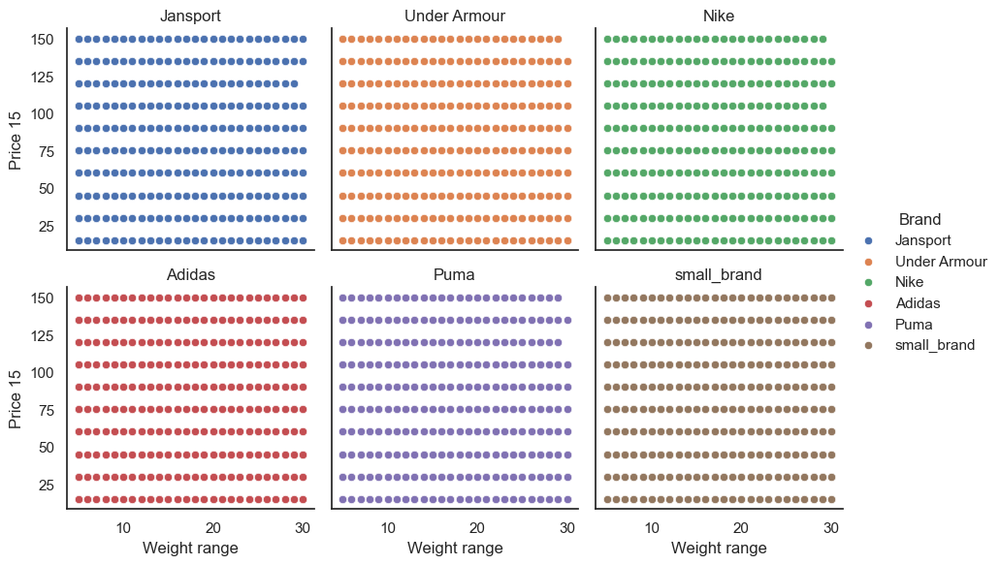

In [127]:
# FacetGrid for separate plots per Brand.
g = sns.FacetGrid(Backpack_df, col='Brand', hue='Brand', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight range', 'Price 15')
g.add_legend()
g.set_axis_labels('Weight range', 'Price 15')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Brand_Price15_Weight1.png')
plt.show()

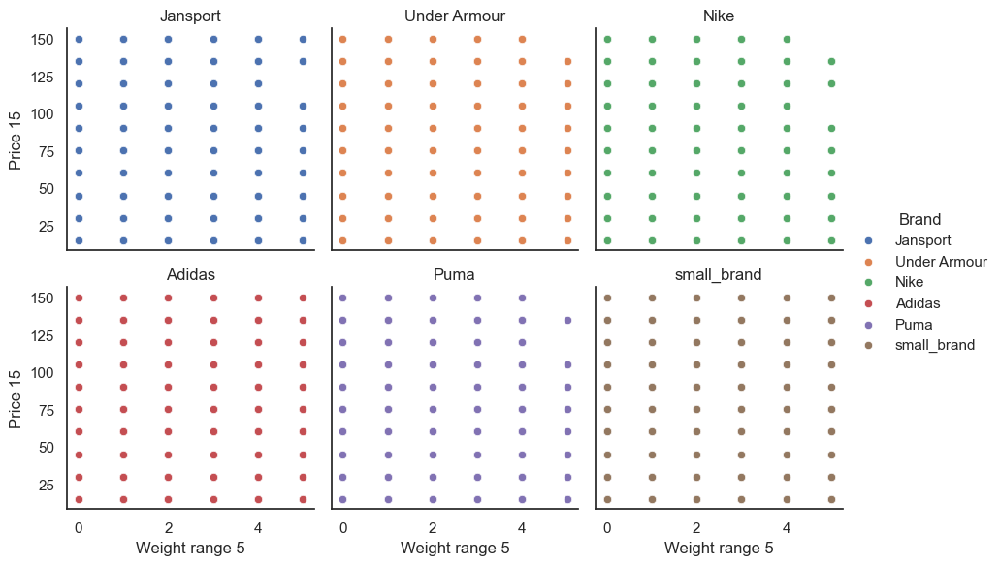

In [128]:
# FacetGrid for separate plots per Brand.
g = sns.FacetGrid(Backpack_df, col='Brand', hue='Brand', col_wrap=3) # col_wrap controls number of plots per row
g.map(sns.scatterplot, 'Weight range 5', 'Price 15')
g.add_legend()
g.set_axis_labels('Weight range 5', 'Price 15')
g.set_titles(col_template="{col_name}")
# g.set(xticks=Backpack_df['Compartments'].unique())
plt.savefig('Fig/Brand_Price15_Weight1.png')
plt.show()